# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [15]:
%matplotlib inline

import numpy as np
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
from utils import get_dataset

In [16]:
dataset = get_dataset("./data/waymo/processed/*.tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['./data/waymo/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/waymo/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 67


## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [17]:
def display_instances(batch, w=5, h=2):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    # Color map for bbox classes
    c_map = {1: [1, 0, 0], 2: [0, 1, 0], 4: [0, 0, 1]}

    f, axes = plt.subplots(h, w, figsize=(20, 20))
    iterator = iter(batch)
    
    for i, ax in enumerate(axes.ravel()):
        instance = next(iterator)
        img = Image.fromarray(instance['image'].numpy())
        ax.imshow(img)

        classes = instance['groundtruth_classes'].numpy()
        bboxes = instance['groundtruth_boxes'].numpy()
        # Scale box size to image
        img_h, img_w = img.size
        bboxes[:, [0, 2]] *= img_w
        bboxes[:, [1, 3]] *= img_h
        for cl, bb in zip(classes, bboxes):
            y1, x1, y2, x2 = bb
            rec = Rectangle((x1, y1), (x2 - x1), (y2 - y1), facecolor='none', edgecolor=c_map[cl])
            ax.add_patch(rec) 
        ax.axis('off') 
    plt.tight_layout()
    plt.show()

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

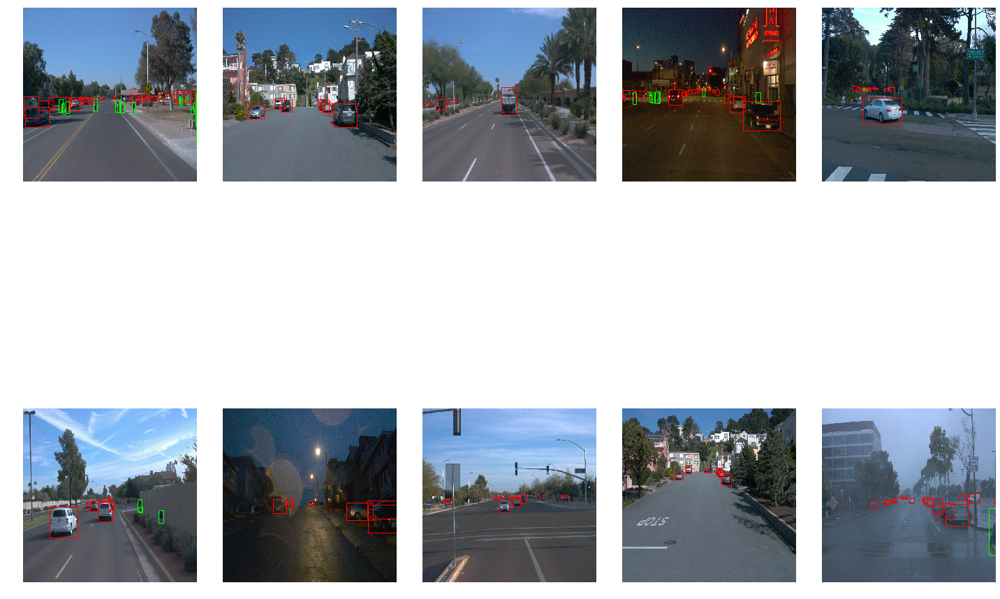

In [53]:
display_instances(dataset.shuffle(1000).take(10))

Take away( from shuffling sometimes)
* water drop is attached to image when weather is cloudy
* vehicle are detected mostly, while cyclist are less likey to be seen
* detecting at night, foggy, or rainy is hard compared to do detection at sunny day
* pedestrian are mostly at crosswalk or sidewalk
* most objects are detected within bottom half of image
* pedestrian box are elogated compared to vehicles.

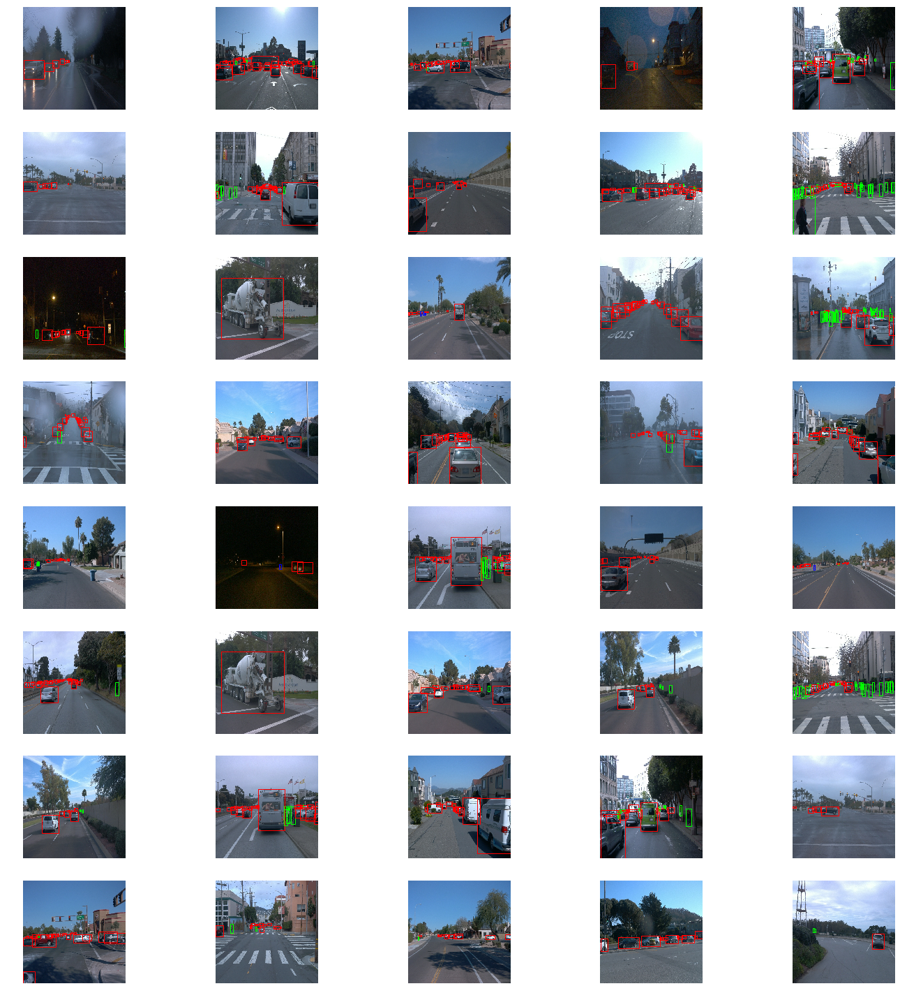

In [54]:
display_instances(dataset.shuffle(1000).take(40), w=5, h=8)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

### General understanding 

In [55]:
heights = []
widths = []
classes = []
n_img = 0
n_boxes = 0
for i, instance in enumerate(dataset.shuffle(1000).take(100)):
    n_img +=1
    img = Image.fromarray(instance['image'].numpy())
    cl = instance['groundtruth_classes'].numpy()
    classes.extend(cl)
    n_boxes += len(cl)
    h, w = img.size
    heights.append(h)
    widths.append(w)

print('Number of images: ',n_img)
print('Number of bounding boxes: ', n_boxes)
print('Max/min/avg height: ', max(heights), min(heights), int(sum(heights)/len(heights)))
print('Max/min/avg width: ', max(widths), min(widths), int(sum(widths)/len(widths)))

Number of images:  100
Number of bounding boxes:  1964
Max/min/avg height:  640 640 640
Max/min/avg width:  640 640 640


Take away
* Can read all tf files, and be able to convert it to image
* all images are the same aspect ration 1:1, like 640 * 640

Get object distribution per class

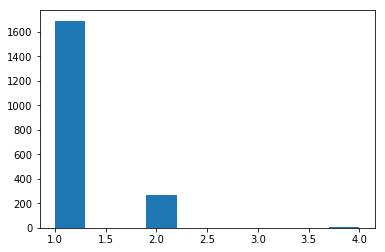

In [56]:
plt.hist(classes);

Take away
* There are class imbalances
* pedestrian and cyclist are relativly small detected, while vehicle are mostly
* especially, cyclist object are less than 50
* ration of distribution are vehicle: pedestrian: cyclist, 34:12:1

### Gain color thresholding for hls and rgb image 

In [57]:
red = []
green = []
blue = []
hs = []
ss = []
vs = []
for instance in dataset.shuffle(100).take(100):
    img = instance['image'].numpy()
    hsv_img = Image.fromarray(img).convert('HSV')
    hsv_img = np.array(hsv_img)
    R, G, B = img[..., 0], img[..., 1], img[..., 2]
    H, S, V = hsv_img[..., 0], hsv_img[..., 1], hsv_img[..., 2]
    red.extend(R.flatten().tolist())
    green.extend(G.flatten().tolist())
    blue.extend(B.flatten().tolist())
    hs.extend(H.flatten().tolist())
    ss.extend(S.flatten().tolist())
    vs.extend(V.flatten().tolist())


(array([1307900., 2056302., 2601191., 3370573., 4636192., 6790338.,
        5891917., 2719948., 1650599., 1332974., 1644642., 1199159.,
         964203., 1037553., 3756509.]),
 array([  0.,  17.,  34.,  51.,  68.,  85., 102., 119., 136., 153., 170.,
        187., 204., 221., 238., 255.]),
 <a list of 15 Patch objects>)

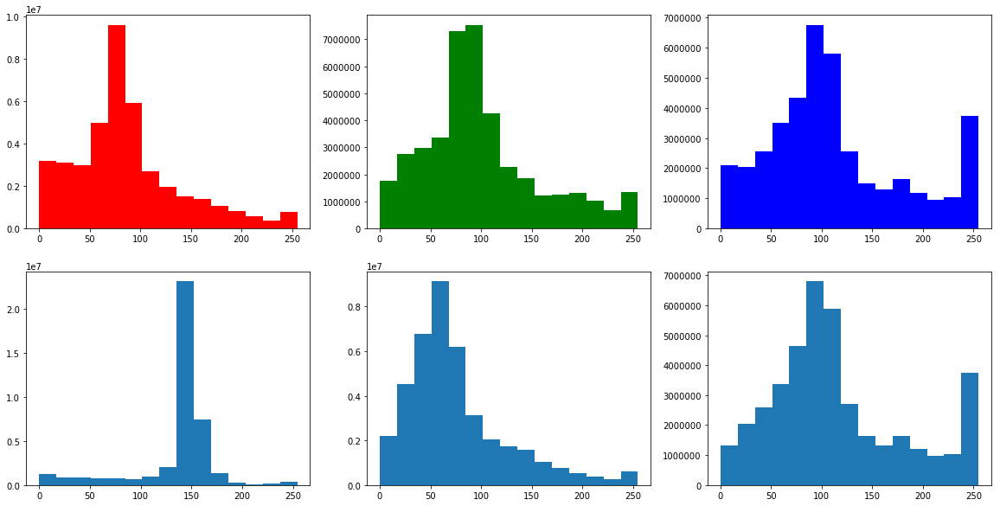

In [58]:
f, ax = plt.subplots(2, 3, figsize=(20, 10))
ax[0, 0].hist(red, color='r', bins=15)
ax[0, 1].hist(green, color='g', bins=15)
ax[0, 2].hist(blue, color='b', bins=15)
ax[1, 0].hist(hs, bins=15)
ax[1, 1].hist(ss, bins=15)
ax[1, 2].hist(vs, bins=15)

Take away 
* RGB and HSV color thresholding data are a bit skewed to the right
* value(brightness) are mostly between 50 and 125, which means a few image at day
* hue color code shows green color is seen a lot, red can be seen.
* I guess highest value(brightness) are coming from sunset

### Display image containing only one class

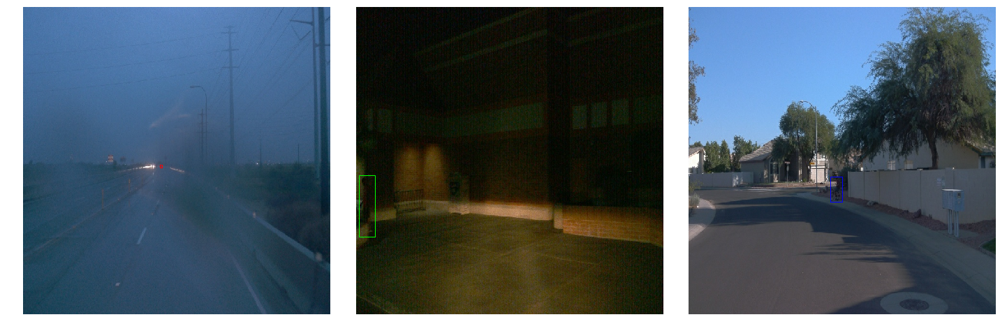

In [59]:
def display_one_class_img(ds):
    instances = []
    for instance in ds:
        if len(instances) == 3:
            break
            
        classes = instance['groundtruth_classes']
        uniq_classes = np.unique(classes)
        if len(classes)==0 or len(uniq_classes) != len(classes):
            continue
        if any(uniq_classes[0] in instance['groundtruth_classes'] for instance in instances):
            continue
        instances.append(instance)
        
    display_instances(instances, w=3, h=1)

display_one_class_img(dataset)

Take away
* Image with one class object are found

### Display image with max number of bboxes, and min number of bboxes

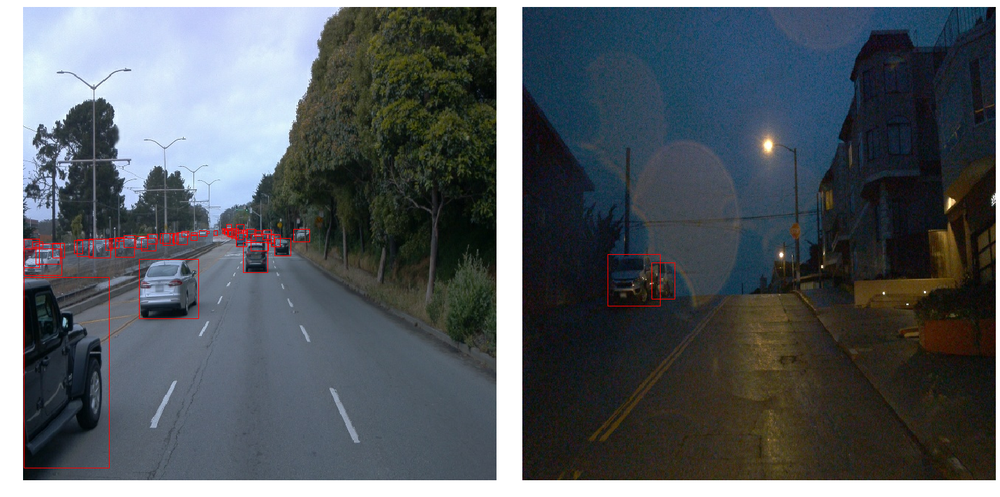

In [60]:
def display_maxmin_bbox_img(ds):
    instances = []
    bbox_map = {
        'max': None,
        'min': None,
    }
    for i, instance in ds.enumerate():
        if i == 1000:
            break
        classes = instance['groundtruth_classes'].numpy()
        if not bbox_map['max'] or len(classes) > len(bbox_map['max']):
            bbox_map['max'] = instance
        if not bbox_map['min'] or len(classes) < len(bbox_map['min']):
            bbox_map['min'] = instance
    display_instances(bbox_map.values(), w=2, h=1)

display_maxmin_bbox_img(dataset)

Take away
* most of detected object in crowdy environment are vehicle.
* especially car in traffic have a lot of bounding boxes.

##### Display image with no bounding boxes

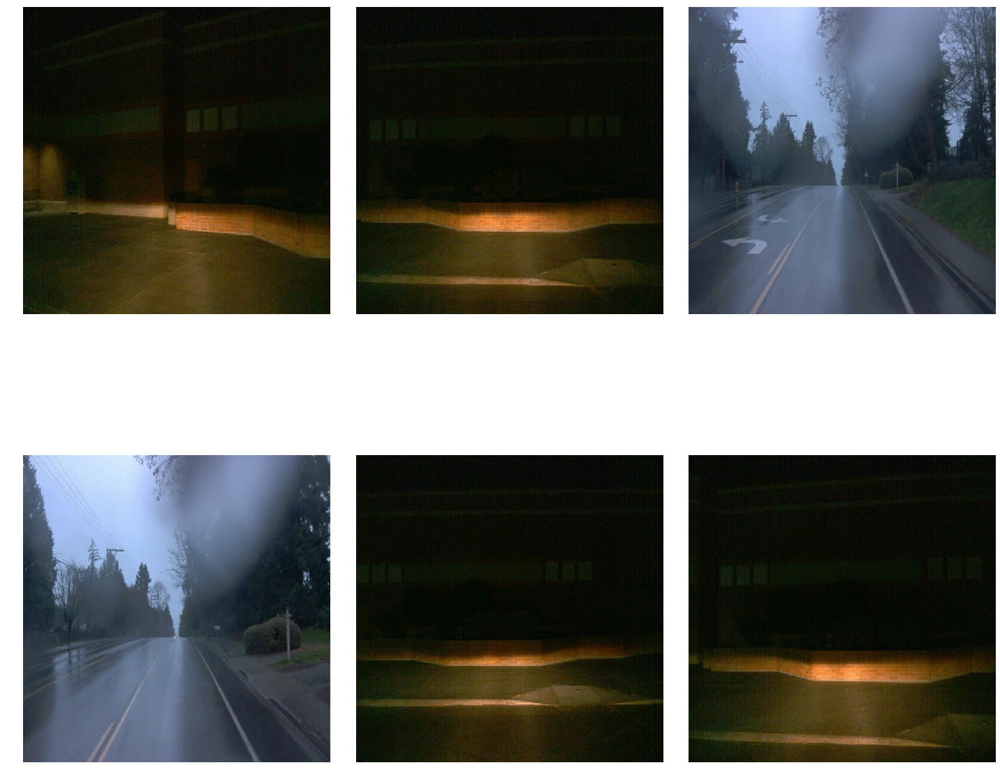

In [65]:
def display_non_bbox_img(ds):
    instances = []
    
    for i, instance in ds.enumerate():
        if i == 1000 or len(instances) == 6:
            break
        classes = instance['groundtruth_classes'].numpy()
        if len(classes) > 0:
            continue
        instances.append(instance)
    display_instances(instances, w=3, h=2)

display_non_bbox_img(dataset.shuffle(1000))

Take away
* Some images has zero bounding boxes
* And some of them look similar to each other, with no labeled objects, which might effect no good for learning later